Contains improvements from V1:

Handles missing ticker data

Implements:
Parallel Processing: The joblib.Parallel and joblib.delayed are used to run the cointegration tests in parallel, which significantly speeds up the process.
Basic Checks: Basic checks are added to ensure data shapes and validity.

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

$BF.B: possibly delisted; No price data found  (1d 2018-01-01 -> 2023-01-01)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

Epoch 1/50
36/36 [==============================] - 1s 11ms/step - loss: 0.2452 - val_loss: 0.2392
Epoch 2/50
36/36 [==============================] - 0s 4ms/step - loss: 0.2327 - val_loss: 0.2229
Epoch 3/50
36/36 [==============================] - 0s 4ms/step - loss: 0.2153 - val_loss: 0.2011
Epoch 4/50
36/36 [==============================] - 0s 4ms/step - loss: 0.1955 - val_loss: 0.1776
Epoch 5/50
36/36 [==============================] - 0s 5ms/step - loss: 0.1761 - val_loss: 0.1564
Epoch 6/50
36/36 [==============================] - 0s 6ms/step - loss: 0.1591 - val_loss: 0.1387
Epoch 7/50
36/36 [==============================] - 0s 4ms/step - loss: 0.1447 - val_loss: 0.1246
Epoch 8/50
36/36 [==============================] - 0s 4ms/step - loss: 0.1326 - val_loss: 0.1133
Epoch 9/50
36/36 [==============================] - 0s 4ms/step - loss: 0.1222 - val_loss: 0.1042
Epoch 10/50
36/36 [==============================] - 0s 4ms/step - loss: 0.1132 - val_loss: 0.0965
Epoch 11/50
36/36 

c:\Users\MP\anaconda3\envs\algo\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\MP\anaconda3\envs\algo\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


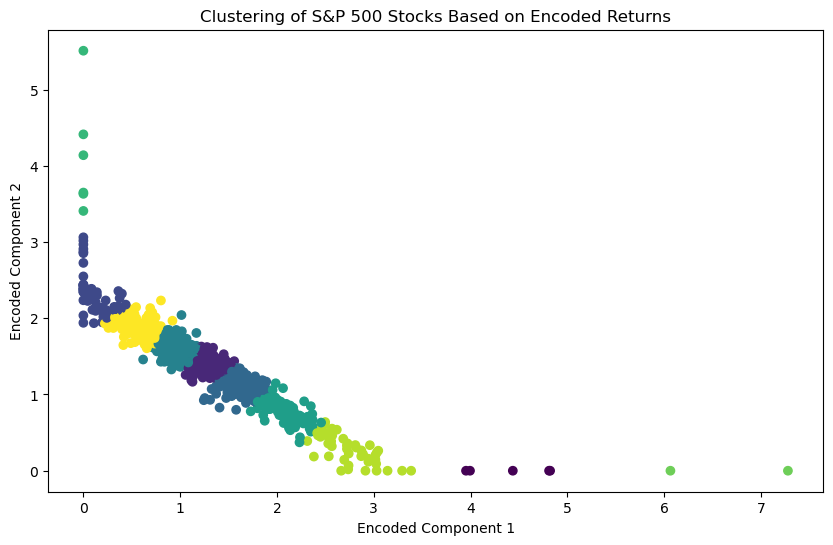

IndexError: boolean index did not match indexed array along dimension 0; dimension is 486 but corresponding boolean dimension is 1258

In [1]:
import numpy as np
import pandas as pd
import yfinance as yf
from statsmodels.tsa.stattools import coint
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
from joblib import Parallel, delayed

# Get S&P 500 constituents
url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
sp500_table = pd.read_html(url)
sp500_symbols = sp500_table[0]['Symbol'].tolist()

# Download historical data and handle tickers with errors
data = pd.DataFrame()
for symbol in sp500_symbols:
    try:
        ticker_data = yf.download(symbol, start='2018-01-01', end='2023-01-01')['Adj Close']
        data = pd.concat([data, ticker_data], axis=1)
    except:
        print(f"Failed to download data for {symbol}. Skipping...")
        continue

# Drop tickers with too many missing values
missing_threshold = 0.1  # Drop tickers with more than 10% missing data
data = data.dropna(thresh=int(data.shape[0] * (1 - missing_threshold)), axis=1)

# Handle remaining missing data: fill forward, then fill backward
data.fillna(method='ffill', inplace=True)
data.fillna(method='bfill', inplace=True)

# Ensure no inf or nan values are present
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)

# Check if the data is empty after cleaning
if data.empty:
    raise ValueError("Data is empty after cleaning. Please check the data source and handling steps.")

# Calculate daily returns
returns = data.pct_change().dropna()

# Check if the returns DataFrame is empty
if returns.empty:
    raise ValueError("Returns data is empty after calculating percentage changes. Please check the data source and handling steps.")

# Define an autoencoder model
input_dim = returns.shape[1]
encoding_dim = 2

input_layer = Input(shape=(input_dim,))
encoder = Dense(encoding_dim, activation='relu')(input_layer)
decoder = Dense(input_dim, activation='sigmoid')(encoder)

autoencoder = Model(inputs=input_layer, outputs=decoder)
autoencoder.compile(optimizer='adam', loss='mse')

# Train the autoencoder
autoencoder.fit(returns.values, returns.values, epochs=50, batch_size=32, shuffle=True, validation_split=0.1)

# Encode the returns data
encoder_model = Model(inputs=input_layer, outputs=encoder)
encoded_data = encoder_model.predict(returns.values)

# Perform KMeans clustering on the encoded data
kmeans = KMeans(n_clusters=10)
kmeans.fit(encoded_data)
labels = kmeans.labels_

# Visualize the clusters
plt.figure(figsize=(10, 6))
plt.scatter(encoded_data[:, 0], encoded_data[:, 1], c=labels, cmap='viridis')
plt.xlabel('Encoded Component 1')
plt.ylabel('Encoded Component 2')
plt.title('Clustering of S&P 500 Stocks Based on Encoded Returns')
plt.show()

# Function to perform the cointegration test for a pair
def coint_test(stock1, stock2, significance_level=0.05):
    result = coint(stock1, stock2)
    p_value = result[1]
    return p_value < significance_level

# Function to perform the cointegration test
def find_cointegrated_pairs(data, significance_level=0.05):
    n = data.shape[1]
    if n < 2:
        raise ValueError("Not enough data to perform cointegration test.")
    keys = data.columns
    pairs = []

    # Use parallel processing to speed up the cointegration tests
    results = Parallel(n_jobs=-1)(delayed(coint_test)(data[keys[i]], data[keys[j]], significance_level) 
                                  for i in range(n) for j in range(i+1, n))

    # Extract pairs from the results
    for i in range(n):
        for j in range(i+1, n):
            if results.pop(0):
                pairs.append((keys[i], keys[j]))
    
    return pairs

# Function to get pairs from clusters
def get_pairs_from_clusters(labels, data, significance_level=0.05):
    unique_labels = np.unique(labels)
    pairs = []
    for label in unique_labels:
        cluster_stocks = data.columns[labels == label]
        cluster_data = data[cluster_stocks]
        if cluster_data.shape[1] < 2:
            continue  # Skip clusters with less than 2 stocks
        cluster_pairs = find_cointegrated_pairs(cluster_data, significance_level)
        pairs.extend(cluster_pairs)
    return pairs

# Get pairs from clusters
clustered_pairs = get_pairs_from_clusters(labels, data)

print(f"Identified pairs: {clustered_pairs}")


# Machine Learning Version

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

$BF.B: possibly delisted; No price data found  (1d 2018-01-01 -> 2023-01-01)



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%******

Epoch 1/50
36/36 [==============================] - 1s 13ms/step - loss: 0.2455 - val_loss: 0.2399
Epoch 2/50
36/36 [==============================] - 0s 5ms/step - loss: 0.2334 - val_loss: 0.2239
Epoch 3/50
36/36 [==============================] - 0s 6ms/step - loss: 0.2152 - val_loss: 0.2006
Epoch 4/50
36/36 [==============================] - 0s 6ms/step - loss: 0.1919 - val_loss: 0.1730
Epoch 5/50
36/36 [==============================] - 0s 7ms/step - loss: 0.1666 - val_loss: 0.1449
Epoch 6/50
36/36 [==============================] - 0s 7ms/step - loss: 0.1421 - val_loss: 0.1196
Epoch 7/50
36/36 [==============================] - 0s 6ms/step - loss: 0.1201 - val_loss: 0.0982
Epoch 8/50
36/36 [==============================] - 0s 8ms/step - loss: 0.1011 - val_loss: 0.0808
Epoch 9/50
36/36 [==============================] - 0s 6ms/step - loss: 0.0853 - val_loss: 0.0668
Epoch 10/50
36/36 [==============================] - 0s 7ms/step - loss: 0.0722 - val_loss: 0.0557
Epoch 11/50
36/36 

c:\Users\MP\anaconda3\envs\algo\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


Encoded data shape: (1258, 2)
Labels shape: (1258,)
Returns columns: Index(['MMM', 'AOS', 'ABT', 'ABBV', 'ACN', 'ADBE', 'AMD', 'AES', 'AFL', 'A',
       ...
       'WY', 'WMB', 'WTW', 'WYNN', 'XEL', 'XYL', 'YUM', 'ZBRA', 'ZBH', 'ZTS'],
      dtype='object', length=486)


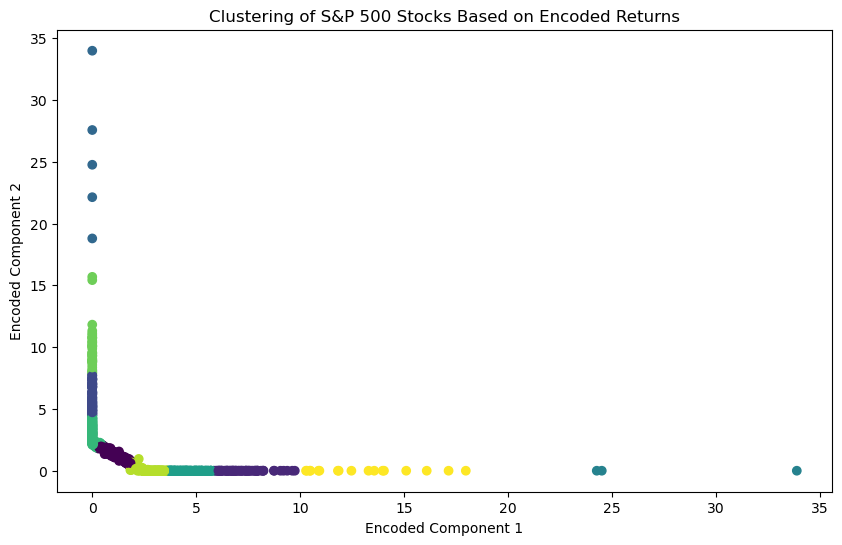

Identified pairs: [(Timestamp('2018-01-09 00:00:00'), Timestamp('2018-01-10 00:00:00')), (Timestamp('2018-01-09 00:00:00'), Timestamp('2018-01-18 00:00:00')), (Timestamp('2018-01-09 00:00:00'), Timestamp('2018-01-24 00:00:00')), (Timestamp('2018-01-09 00:00:00'), Timestamp('2018-01-25 00:00:00')), (Timestamp('2018-01-09 00:00:00'), Timestamp('2018-01-31 00:00:00')), (Timestamp('2018-01-09 00:00:00'), Timestamp('2018-02-01 00:00:00')), (Timestamp('2018-01-09 00:00:00'), Timestamp('2018-02-07 00:00:00')), (Timestamp('2018-01-09 00:00:00'), Timestamp('2018-02-16 00:00:00')), (Timestamp('2018-01-09 00:00:00'), Timestamp('2018-02-22 00:00:00')), (Timestamp('2018-01-09 00:00:00'), Timestamp('2018-03-07 00:00:00')), (Timestamp('2018-01-09 00:00:00'), Timestamp('2018-03-12 00:00:00')), (Timestamp('2018-01-09 00:00:00'), Timestamp('2018-03-15 00:00:00')), (Timestamp('2018-01-09 00:00:00'), Timestamp('2018-03-20 00:00:00')), (Timestamp('2018-01-09 00:00:00'), Timestamp('2018-03-21 00:00:00')), (

In [5]:
import numpy as np
import pandas as pd
import yfinance as yf
from statsmodels.tsa.stattools import coint
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
from joblib import Parallel, delayed

# Get S&P 500 constituents
url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
sp500_table = pd.read_html(url)
sp500_symbols = sp500_table[0]['Symbol'].tolist()

# Download historical data and handle tickers with errors
data_frames = []
symbols = []

for symbol in sp500_symbols:
    try:
        ticker_data = yf.download(symbol, start='2018-01-01', end='2023-01-01')['Adj Close']
        data_frames.append(ticker_data.rename(symbol))
        symbols.append(symbol)
    except Exception as e:
        print(f"Failed to download data for {symbol}: {e}. Skipping...")

# Concatenate all data at once
data = pd.concat(data_frames, axis=1)

# Drop tickers with too many missing values
missing_threshold = 0.1  # Drop tickers with more than 10% missing data
data = data.dropna(thresh=int(data.shape[0] * (1 - missing_threshold)), axis=1)

# Handle remaining missing data: fill forward, then fill backward
data.fillna(method='ffill', inplace=True)
data.fillna(method='bfill', inplace=True)

# Ensure no inf or nan values are present
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)

# Check if the data is empty after cleaning
if data.empty:
    raise ValueError("Data is empty after cleaning. Please check the data source and handling steps.")

# Calculate daily returns
returns = data.pct_change().dropna()

# Check if the returns DataFrame is empty
if returns.empty:
    raise ValueError("Returns data is empty after calculating percentage changes. Please check the data source and handling steps.")

# Define an autoencoder model
input_dim = returns.shape[1]
encoding_dim = 2

input_layer = Input(shape=(input_dim,))
encoder = Dense(encoding_dim, activation='relu')(input_layer)
decoder = Dense(input_dim, activation='sigmoid')(encoder)

autoencoder = Model(inputs=input_layer, outputs=decoder)
autoencoder.compile(optimizer='adam', loss='mse')

# Train the autoencoder
autoencoder.fit(returns.values, returns.values, epochs=50, batch_size=32, shuffle=True, validation_split=0.1)

# Encode the returns data
encoder_model = Model(inputs=input_layer, outputs=encoder)
encoded_data = encoder_model.predict(returns.values)

# Perform KMeans clustering on the encoded data
kmeans = KMeans(n_clusters=10, n_init=10)  # Explicitly set n_init to 10
kmeans.fit(encoded_data)
labels = kmeans.labels_

# Check data and labels shapes
print(f"Encoded data shape: {encoded_data.shape}")
print(f"Labels shape: {labels.shape}")
print(f"Returns columns: {returns.columns}")

# If the labels do not match the number of columns in returns, adjust labels
if len(labels) != returns.shape[0]:
    raise ValueError("Labels length does not match the number of rows in returns. Please check the clustering process.")

# Visualize the clusters
plt.figure(figsize=(10, 6))
plt.scatter(encoded_data[:, 0], encoded_data[:, 1], c=labels, cmap='viridis')
plt.xlabel('Encoded Component 1')
plt.ylabel('Encoded Component 2')
plt.title('Clustering of S&P 500 Stocks Based on Encoded Returns')
plt.show()

# Function to perform the cointegration test for a pair
def coint_test(stock1, stock2, significance_level=0.05):
    result = coint(stock1, stock2)
    p_value = result[1]
    return p_value < significance_level

# Function to perform the cointegration test
def find_cointegrated_pairs(data, significance_level=0.05):
    n = data.shape[1]
    if n < 2:
        raise ValueError("Not enough data to perform cointegration test.")
    keys = data.columns
    pairs = []

    # Use parallel processing to speed up the cointegration tests
    results = Parallel(n_jobs=-1)(delayed(coint_test)(data[keys[i]], data[keys[j]], significance_level) 
                                  for i in range(n) for j in range(i+1, n))

    # Extract pairs from the results
    for i in range(n):
        for j in range(i+1, n):
            if results.pop(0):
                pairs.append((keys[i], keys[j]))
    
    return pairs

# Function to get pairs from clusters
def get_pairs_from_clusters(labels, data, significance_level=0.05):
    unique_labels = np.unique(labels)
    pairs = []
    for label in unique_labels:
        cluster_stocks = data.columns[labels == label]
        cluster_data = data[cluster_stocks]
        if cluster_data.shape[1] < 2:
            continue  # Skip clusters with less than 2 stocks
        cluster_pairs = find_cointegrated_pairs(cluster_data, significance_level)
        pairs.extend(cluster_pairs)
    return pairs

# Get pairs from clusters
clustered_pairs = get_pairs_from_clusters(labels, returns.T)  # Transpose returns to match labels

print(f"Identified pairs: {clustered_pairs}")
